<a href="https://colab.research.google.com/github/elopna/jupyter_notebook/blob/main/solar_energy_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [24]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
import seaborn as sns
import datetime
import matplotlib.pyplot as plt
%matplotlib inline

In [25]:
df = pd.read_csv('/content/drive/My Drive/data/38.csv')
print(df.shape)
df.head()

(16503, 17)


,date_time_clouds,clouds,station_id,insolation_value,power_value,minutes_of_daylight,part_of_the_daylight,morning,afternoon,evening,angle,altitude,month,insolation_max,insolation_ratio,cloud_insolation_product,cloud_altitude_product
0,2019-07-01 05:00:00,0.436559,38,21.286000,0.057757,934.0,0.034261,1,0,0,23.120484,4.011289,7,36.614734,0.581351,15.984497,1.751165
1,2019-07-01 05:30:00,0.528763,38,46.264242,0.377800,934.0,0.066381,1,0,0,23.120484,8.743461,7,98.130755,0.471455,51.887956,4.623223
2,2019-07-01 06:00:00,0.620968,38,96.786046,0.778110,934.0,0.098501,1,0,0,23.120484,13.663870,7,171.787725,0.563405,106.674636,8.484823
3,2019-07-01 06:30:00,0.558333,38,152.763385,1.312607,934.0,0.130621,1,0,0,23.120484,18.732890,7,253.762202,0.601994,141.683896,10.459197
4,2019-07-01 07:00:00,0.495699,38,183.816872,2.577917,934.0,0.162741,1,0,0,23.120484,23.913128,7,341.086305,0.538916,169.076115,11.853712


In [26]:
df['dt'] = pd.to_datetime(df['date_time_clouds'])
df.set_index('dt', inplace=True)
df.drop('date_time_clouds',axis=1,inplace=True)
df.sort_index(inplace=True)
df.shape

(16503, 16)

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 16503 entries, 2019-07-01 05:00:00 to 2021-05-31 19:30:00
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   clouds                    16503 non-null  float64
 1   station_id                16503 non-null  int64  
 2   insolation_value          16491 non-null  float64
 3   power_value               16503 non-null  float64
 4   minutes_of_daylight       16503 non-null  float64
 5   part_of_the_daylight      16503 non-null  float64
 6   morning                   16503 non-null  int64  
 7   afternoon                 16503 non-null  int64  
 8   evening                   16503 non-null  int64  
 9   angle                     16503 non-null  float64
 10  altitude                  16503 non-null  float64
 11  month                     16503 non-null  int64  
 12  insolation_max            16503 non-null  float64
 13  insolation_ratio          

In [28]:
df.describe()

,clouds,station_id,insolation_value,power_value,minutes_of_daylight,part_of_the_daylight,morning,afternoon,evening,angle,altitude,month,insolation_max,insolation_ratio,cloud_insolation_product,cloud_altitude_product
count,16503.000000,16503.0,16491.000000,16503.000000,16503.000000,16503.000000,16503.000000,16503.000000,16503.000000,16503.000000,16503.000000,16503.000000,16503.000000,16491.000000,16503.000000,16503.000000
mean,0.568868,38.0,327.852380,26.536828,749.445737,0.501829,0.327880,0.332061,0.340059,1.913406,27.615827,6.480579,442.532963,0.704539,249.065801,15.415329
std,0.346244,0.0,276.239263,24.969190,136.417672,0.284659,0.469455,0.470967,0.473743,16.051005,17.615244,3.256381,280.072817,0.313603,231.495676,14.335023
min,0.000000,38.0,0.000000,0.000000,525.000000,0.001142,0.000000,0.000000,0.000000,-23.449783,-1.572237,1.000000,0.018413,0.000000,0.000000,-1.248738
25%,0.251882,38.0,86.944961,5.080833,624.000000,0.255010,0.000000,0.000000,0.000000,-13.454960,13.665350,4.000000,203.254389,0.413720,43.775260,3.259497
50%,0.633871,38.0,250.856164,17.651960,766.000000,0.506217,0.000000,0.000000,0.000000,4.016824,24.466716,7.000000,418.950355,0.850349,189.955109,12.000957
75%,0.910618,38.0,528.312180,45.073365,878.000000,0.747947,1.000000,1.000000,1.000000,17.381656,40.281633,9.000000,668.815500,1.000000,400.213960,23.414953
max,1.000000,38.0,1215.113269,88.000000,938.000000,0.998871,1.000000,1.000000,1.000000,23.449783,68.204305,12.000000,995.874553,1.000000,976.143182,67.251714


In [29]:
df.describe(include=['object', 'int'])

,station_id,morning,afternoon,evening,month
count,16503.0,16503.000000,16503.000000,16503.000000,16503.000000
mean,38.0,0.327880,0.332061,0.340059,6.480579
std,0.0,0.469455,0.470967,0.473743,3.256381
min,38.0,0.000000,0.000000,0.000000,1.000000
25%,38.0,0.000000,0.000000,0.000000,4.000000
50%,38.0,0.000000,0.000000,0.000000,7.000000
75%,38.0,1.000000,1.000000,1.000000,9.000000
max,38.0,1.000000,1.000000,1.000000,12.000000


In [30]:
df.morning.sum() + df.afternoon.sum() + df.evening.sum() == len(df)

True

Датасет состоит из набора параметров с вещественными значениями, бинарными (утро-день-вечер) и категориальным (месяц). Грубо: преобразуем категориальный в бинарный, в зависимости от того, "теплый (солнечный)" этот месяц или не очень:

In [31]:
df.loc[:,'warm_season'] = 1
df.loc[df.month.isin([10,11,12,1,2,3]),'warm_season'] = 0

In [32]:
df.isnull().sum().sum()

24

Также есть немного пропусков в данных. Посмотрим сначала на сами параметры и проверим наличие дубликатов:

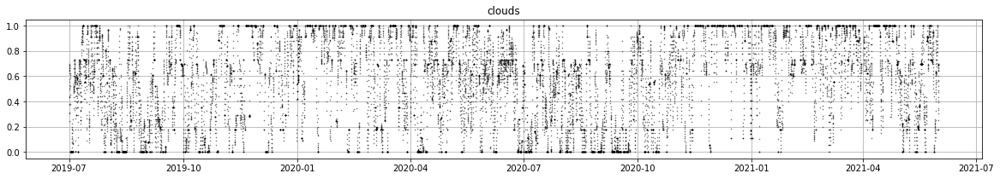

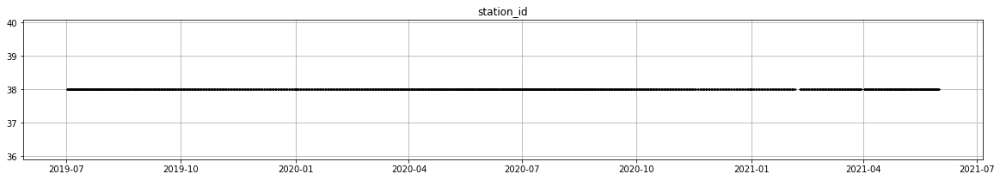

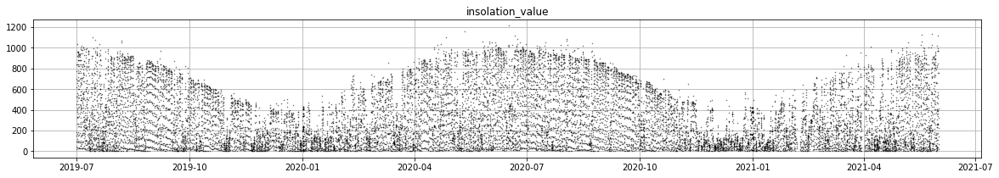

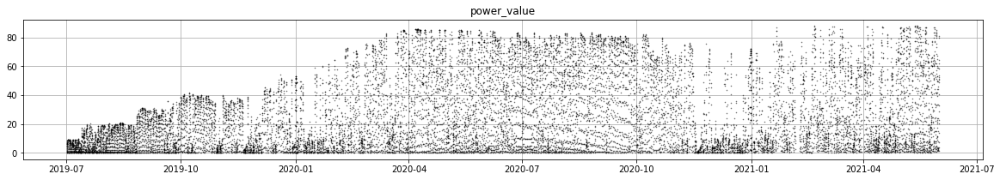

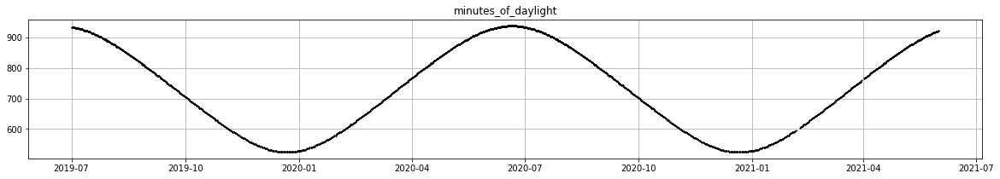

...

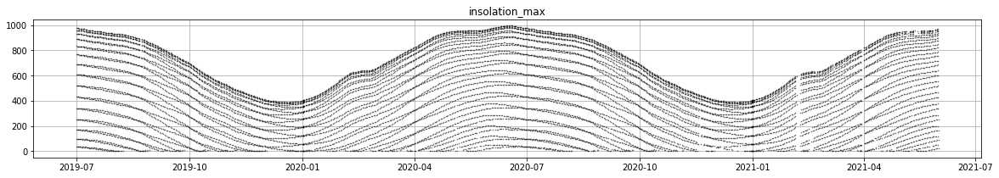

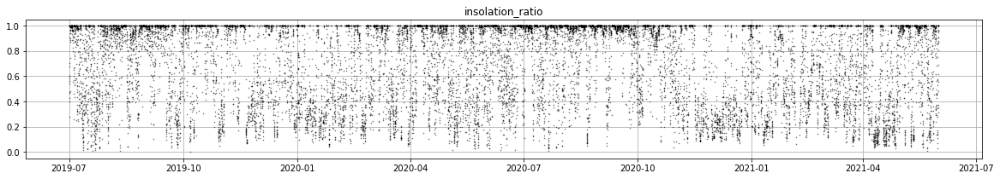

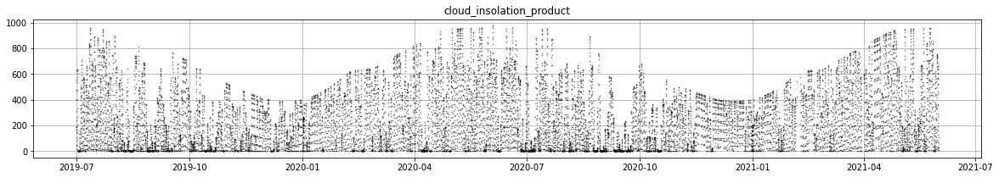

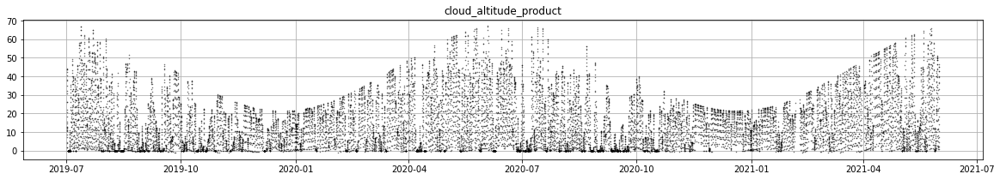

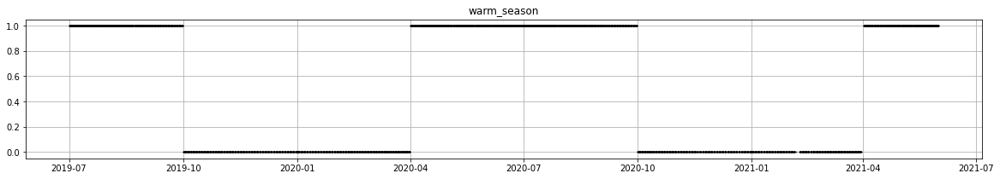

In [33]:
for col in df.columns:
    plt.figure(figsize=[20,3])
    plt.title(col)
    plt.plot(df[col],'.',ms=1, alpha=0.6, color='black')
    plt.grid()

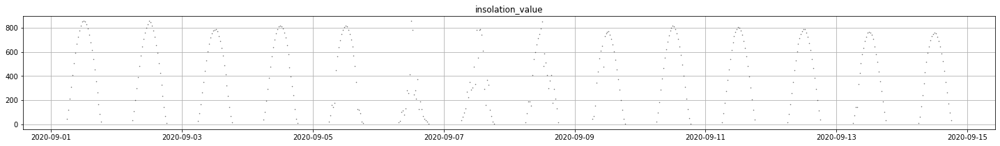

In [34]:
mask = (df.index > datetime.datetime(2020,9,1)) & (df.index < datetime.datetime(2020,9,15))

plt.figure(figsize=[25,3])
plt.title('insolation_value')
plt.plot(df.loc[mask,'insolation_value'],'.',ms=1, alpha=0.6, color='black')
plt.grid()

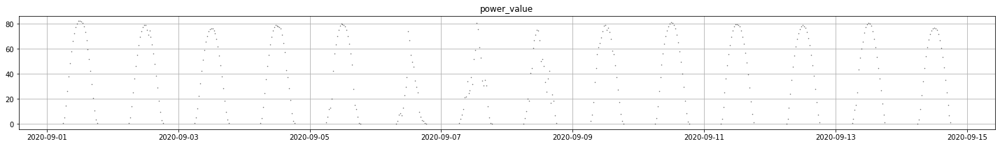

In [35]:
plt.figure(figsize=[25,3])
plt.title('power_value')
plt.plot(df.loc[mask,'power_value'],'.',ms=1, alpha=0.6, color='black')
plt.grid()
plt.show()

Очевиден сезонный характер целевых параметров: глобальные максимумы летом и локальные в полдень. Есть некоторая флуктуация частоты записей. Также есть дни "плохих измерений". Почти все параметры (кроме облачности и связанных с ней). могут быть достаточно точно известны в будущем. Соответственно, можно выделить несколько подходов к оценке целевых параметров:

Авторегрессия с дополнительными признаками: прогнозировать insolation_value с помощью SARIMAX, принимающей на вход, помимо целевого ряда, также экзогенные (внешние) параметры.
Обучить модель градиентного бустинга на исторических данных. Для получения прогноза insolation_value: прогнозировать признаки авторегрессионной моделью, после чего подавать их на вход модели градиентного бустинга. Основной вопрос - насколько хорошо можно прогнозировать облачность. Однако, при небольшом горизонте прогнозирования это представляется реальным.
Использовать рекуррентную нейронную сеть. Например, библиотеку pytorch-forecasting
В литературе есть вполне ожидаемые данные о превосходстве методов глубокого обучения над классическими моделями при оценке выработки солнечной энергии. Пример: https://www.researchgate.net/publication/353410774_A_Comparison_of_the_Performance_of_Supervised_Learning_Algorithms_for_Solar_Power_Prediction https://www.researchgate.net/publication/340271219_An_Efficient_Machine_Learning_Approach_for_Accurate_Short_Term_Solar_Power_Prediction https://www.researchgate.net/publication/337494650_SOLAR_POWER_FORECASTING_WITH_LSTM_NETWORK_ENSEMBLE

https://www.researchgate.net/publication/320954164_Feature_Selection_and_ANN_Solar_Power_Prediction (data preprocessing)

Вернемся к дубликатам и пропускам в данных:

In [36]:
df.index.value_counts()

2020-12-31 12:00:00    4
2020-12-31 09:30:00    4
2020-01-01 16:30:00    4
2020-01-01 16:00:00    4
2020-12-31 12:30:00    4
                      ..
2019-09-26 16:30:00    1
2021-03-14 08:30:00    1
2020-11-25 15:30:00    1
2019-10-05 15:30:00    1
2020-10-27 12:30:00    1
Name: dt, Length: 16395, dtype: int64

In [37]:
df.loc['2020-12-31 09:30:00']

,clouds,station_id,insolation_value,power_value,minutes_of_daylight,part_of_the_daylight,morning,afternoon,evening,angle,altitude,month,insolation_max,insolation_ratio,cloud_insolation_product,cloud_altitude_product,warm_season
dt,,,,,,,,,,,,,,,,,
2020-12-31 09:30:00,0.172043,38,380.348,45.442497,529.0,0.189036,1,0,0,-23.011637,12.21984,12,192.970019,1.0,33.199143,2.102338,0
2020-12-31 09:30:00,0.172043,38,380.348,45.442497,529.0,0.189036,1,0,0,-23.011637,12.21984,12,194.562906,1.0,33.473188,2.102338,0
2020-12-31 09:30:00,0.172043,38,380.348,45.442497,529.0,0.189036,1,0,0,-23.011637,12.21984,12,192.970019,1.0,33.199143,2.102338,0
2020-12-31 09:30:00,0.172043,38,380.348,45.442497,529.0,0.189036,1,0,0,-23.011637,12.21984,12,194.562906,1.0,33.473188,2.102338,0


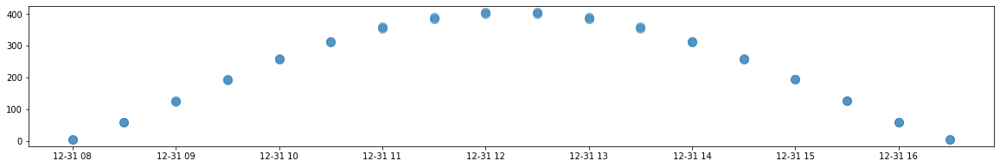

In [38]:
plt.figure(figsize=[20,3])
plt.plot(df[datetime.datetime(2020,12,31):datetime.datetime(2021,1,1)]['insolation_max'],'.',ms=20, alpha=0.3)

In [39]:
df.isnull().sum()

clouds                       0
station_id                   0
insolation_value            12
power_value                  0
minutes_of_daylight          0
part_of_the_daylight         0
morning                      0
afternoon                    0
evening                      0
angle                        0
altitude                     0
month                        0
insolation_max               0
insolation_ratio            12
cloud_insolation_product     0
cloud_altitude_product       0
warm_season                  0
dtype: int64

Дупликация записей значений параметров 'cloud_insolation_product' и 'insolation_max' может быть связана с особенностями работы датчиков или сбора данных. Обработаем данную коллизию, а заодно введем постоянную дискретизацию, сделав resample (отдельно целочисленные и вещественные признаки). Пропуски удалим.

In [40]:
columns_fl = ['clouds', 'station_id', 'insolation_value', 'power_value',
       'minutes_of_daylight', 'part_of_the_daylight', 'altitude', 'insolation_max',
       'insolation_ratio', 'cloud_insolation_product',
       'cloud_altitude_product']
df = df.groupby(df.index).mean()
df[columns_fl] = df[columns_fl].resample('60T').mean()
df[['morning', 'afternoon', 'evening', 'angle', 'warm_season']] = df[['morning', 'afternoon', 'evening', 'angle', 'warm_season']].resample('60T').last()
print(df.shape, df.dropna().shape)
df = df.dropna()
df.shape

(16395, 17) (8199, 17)


(8199, 17)

Визуальная проверка всех предобработок:

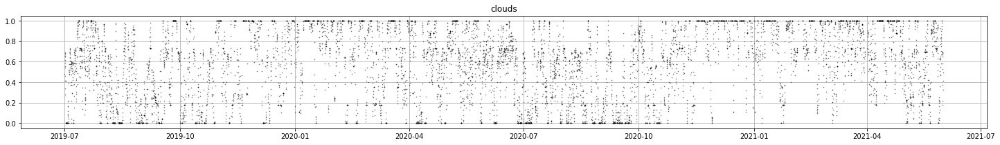

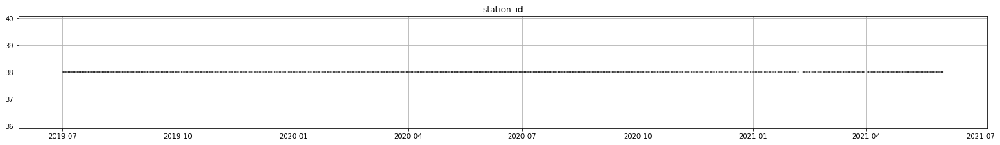

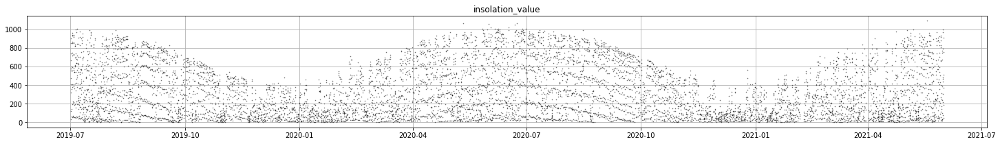

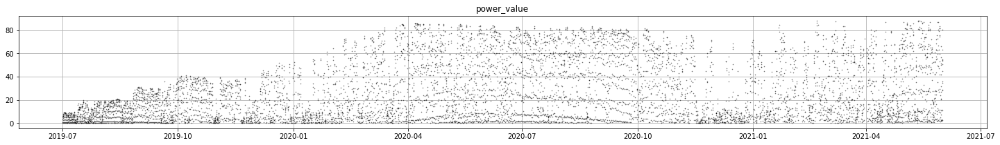

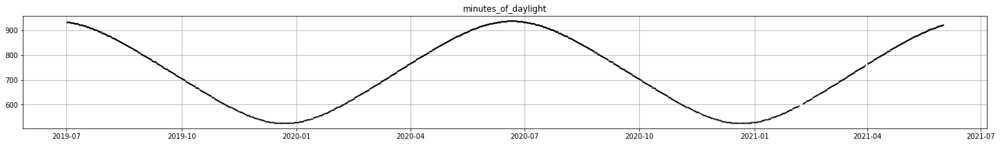

...

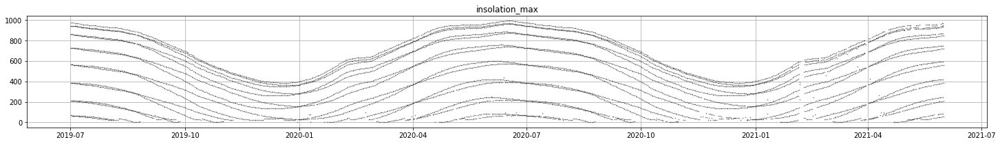

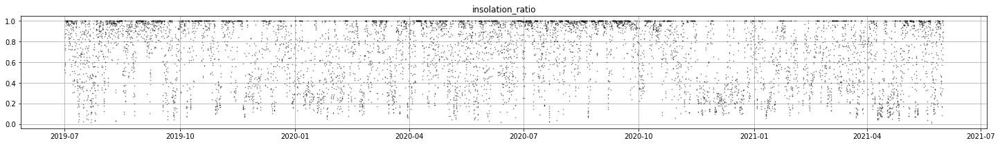

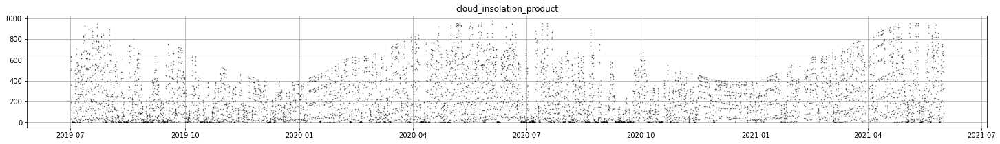

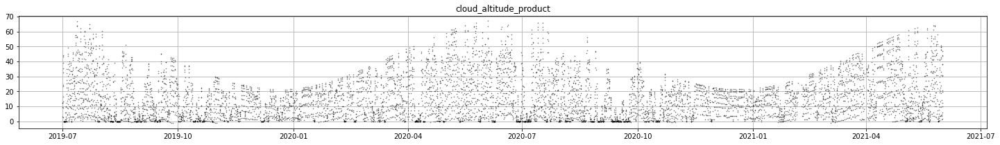

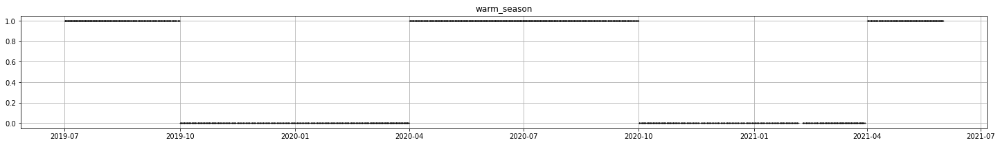

In [42]:
for col in df.columns:
    plt.figure(figsize=[25,3])
    plt.title(col)
    plt.plot(df[col],'.',ms=1, alpha=0.6, color='black')
    plt.grid()

Посмотрим на корреляции между параметрами и распределения вещественных признаков:

In [43]:
corr_matrix = df.drop(['station_id', 'month'], axis=1).corr()
corr_matrix[np.abs(corr_matrix)>0.7]

,clouds,insolation_value,power_value,minutes_of_daylight,part_of_the_daylight,morning,afternoon,evening,angle,altitude,insolation_max,insolation_ratio,cloud_insolation_product,cloud_altitude_product,warm_season
clouds,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.743591,NaN,NaN,NaN
insolation_value,NaN,1.000000,0.8153,NaN,NaN,NaN,NaN,NaN,NaN,0.817666,0.813889,NaN,NaN,NaN,NaN
power_value,NaN,0.815300,1.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
minutes_of_daylight,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,0.999418,NaN,NaN,NaN,NaN,NaN,0.872482
part_of_the_daylight,NaN,NaN,NaN,NaN,1.000000,-0.793698,NaN,0.839085,NaN,NaN,NaN,NaN,NaN,NaN,NaN
morning,NaN,NaN,NaN,NaN,-0.793698,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
afternoon,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
evening,NaN,NaN,NaN,NaN,0.839085,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
angle,NaN,NaN,NaN,0.999418,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,0.879439
altitude,NaN,0.817666,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.990795,NaN,NaN,NaN,NaN


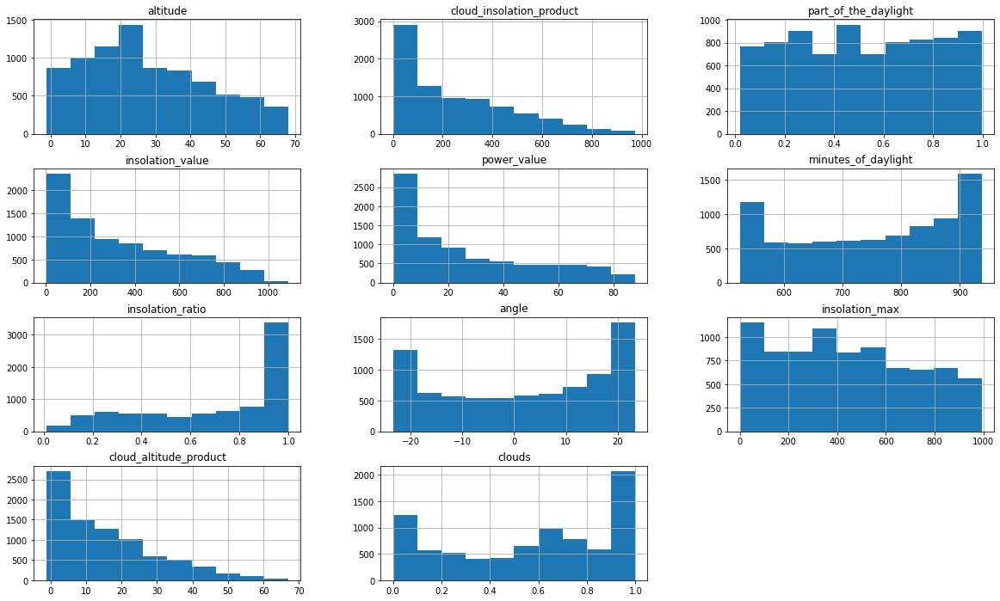

In [44]:
features = list(set(df.columns) - set(['station_id', 'month', 'warm_season', 'morning', 'afternoon', 'evening']))

df[features].hist(figsize=(20,12));

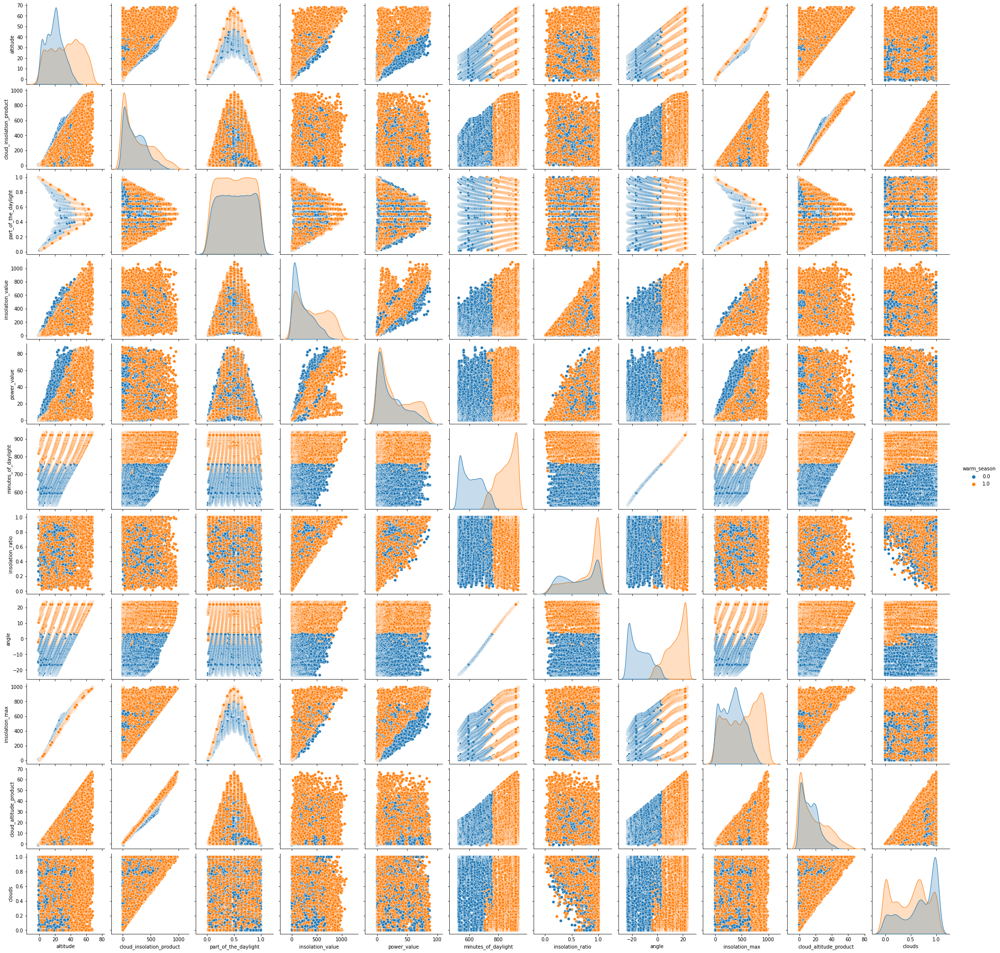

In [45]:
sns.pairplot(df[features + ['warm_season']], hue='warm_season');

Из попарных графиков можно увидеть некоторые вполне понятные и ожидаемые зависимости, вроде таких: "чем выше - тем больше солнца", или "в полдень - максимум выработки солнечной энергии".

In [63]:
features = ['clouds', 'minutes_of_daylight', 'part_of_the_daylight', 'angle', 'altitude',
            'insolation_max', 'insolation_ratio', 'cloud_insolation_product', 'cloud_altitude_product',
            'warm_season', 'morning', 'afternoon', 'evening']
data = df[features].copy()
target = df['insolation_value'].copy()

data.shape, target.shape

((8199, 13), (8199,))

Обучим модель SARIMAX, посмотрим на ее прогноз и оценим ошибки:

In [47]:
%%time

model = sm.tsa.statespace.SARIMAX(target[:], exog=data[:], order=(1, 1, 2), seasonal_order=(1, 0, 1, 15), 
                                             enforce_stationarity=False,
                                             enforce_invertibility=False)

model = model.fit()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


CPU times: user 3min 37s, sys: 2min 34s, total: 6min 11s
Wall time: 3min 22s


In [64]:
y_test = target.iloc[-12:]
x_test = data.iloc[-12:]

forecast = model.forecast(steps = len(x_test),exog = x_test)
forecast.index = y_test.index

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



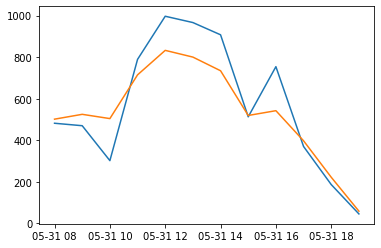

In [65]:
plt.plot(y_test[:])
plt.plot(forecast[:])

In [66]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true).reshape(-1, 1), np.array(y_pred).reshape(-1, 1),
    return np.mean(np.abs((y_true - y_pred) / y_true) * 100, axis=1)
    
mape = np.mean(mean_absolute_percentage_error(y_test, forecast))
mae = np.mean(np.abs(y_test - forecast))
rmse = np.sqrt(np.mean((y_test - forecast)**2))

mape, mae, rmse

(19.162325929681156, 95.8043910258055, 123.05817045930291)

Пути улучшения модели:
 - настройка параметров модели SARIMAX (pdq и сезонные PDQS) с помощью оценки графиков автокорреляции, проверки теста Дики-Фуллера на стационарность, поиска оптимальных параметров по сетке (и оценки информационного критерия Акаике для выбора наилучшего набора).
 - использование TimeSeriesSplit из sklearn.model_selection для более точной оценки качества модели

Попробуем применить pytorch_forecasting:

In [ ]:
# !pip install pytorch_lightning

In [ ]:
# !pip install pytorch_forecasting

In [56]:

import copy
from pathlib import Path
import warnings
import datetime

import numpy as np
import pandas as pd
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger
import torch

from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.metrics import SMAPE, PoissonLoss, QuantileLoss
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters

In [57]:
data['time_idx'] = data.index.date
data['time_idx'] = data['time_idx'].diff().fillna(method='bfill')
data['time_idx'] = data['time_idx'].cumsum().dt.days
data.reset_index(inplace=True)
data.reset_index(inplace=True)
data['index'] = data['index'].astype(int)
data.loc[:,'station_id'] = 'station'

data.shape

(8199, 17)

In [58]:
data.describe()

,index,clouds,minutes_of_daylight,part_of_the_daylight,angle,altitude,insolation_max,insolation_ratio,cloud_insolation_product,cloud_altitude_product,warm_season,morning,afternoon,evening,time_idx
count,8199.000000,8199.000000,8199.000000,8199.000000,8199.000000,8199.000000,8199.000000,8199.000000,8199.000000,8199.000000,8199.000000,8199.000000,8199.000000,8199.000000,8199.000000
mean,4099.000000,0.569271,750.651055,0.517412,2.049391,27.700460,443.823142,0.704754,249.717611,15.456506,0.563971,0.298329,0.323698,0.377973,343.843761
std,2366.991762,0.346556,135.788507,0.283408,15.985085,17.527172,278.461991,0.298558,230.875484,14.302311,0.495921,0.457553,0.467915,0.484910,203.981850
min,0.000000,0.000000,525.000000,0.018265,-23.449783,-1.279023,0.060751,0.010503,0.000000,-1.248738,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2049.500000,0.251344,628.000000,0.274652,-13.122368,13.935938,204.104958,0.442565,43.150973,3.200437,0.000000,0.000000,0.000000,0.000000,170.500000
50%,4099.000000,0.636290,769.000000,0.507761,4.215526,24.787330,414.256096,0.811161,188.852130,11.902220,1.000000,0.000000,0.000000,0.000000,345.000000
75%,6148.500000,0.907930,878.000000,0.760703,17.516495,40.463185,674.032931,0.984115,400.260809,23.549237,1.000000,1.000000,1.000000,1.000000,506.000000
max,8198.000000,1.000000,938.000000,0.998780,23.449783,68.140691,995.207530,1.000000,974.843512,67.099005,1.000000,1.000000,1.000000,1.000000,700.000000


In [59]:
data.shape

(8199, 17)

In [60]:
data['dt'].min(), data['dt'].max()

(Timestamp('2019-07-01 05:00:00'), Timestamp('2021-05-31 19:00:00'))

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:818: LightningDeprecationWarning:

`trainer.tune(train_dataloader)` is deprecated in v1.4 and will be removed in v1.6. Use `trainer.tune(train_dataloaders)` instead. HINT: added 's'


   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 0     
3  | prescalers                         | ModuleDict                      | 1.1 K 
4  | static_variable_selection          | VariableSelectionNetwork        | 0     
5  | encoder_variable_selection         | 

Number of parameters in network: 150.6k


/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/data_loading.py:327: UserWarning:

The number of training samples (30) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.



Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/base_model.py:721: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/base_model.py:721: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/base_model.py:721: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To

--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 566.6815795898438,
 'val_MAPE': 38.3292236328125,
 'val_RMSE': 644.5263671875,
 'val_SMAPE': 1.2734363079071045,
 'val_loss': 198.28970336914062}
--------------------------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/temporal_fusion_transformer/__init__.py:781: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/temporal_fusion_transformer/__init__.py:781: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/base_model.py:721: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until ex

--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 558.4134521484375,
 'val_MAPE': 37.686004638671875,
 'val_RMSE': 634.6242065429688,
 'val_SMAPE': 1.2714108228683472,
 'val_loss': 194.87893676757812}
--------------------------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/temporal_fusion_transformer/__init__.py:781: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/temporal_fusion_transformer/__init__.py:781: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/base_model.py:721: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until ex

--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{'val_MAE': 193.76548767089844,
 'val_MAPE': 4.186171531677246,
 'val_RMSE': 276.25555419921875,
 'val_SMAPE': 1.0066027641296387,
 'val_loss': 62.84613800048828}
--------------------------------------------------------------------------------


/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/temporal_fusion_transformer/__init__.py:781: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/temporal_fusion_transformer/__init__.py:781: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/base_model.py:721: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until ex

suggested learning rate: 0.04514793765986135


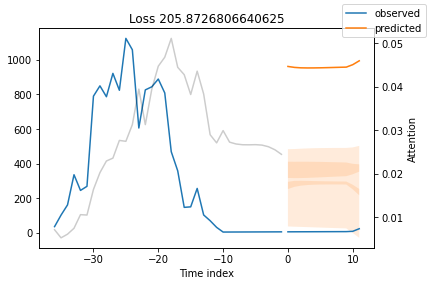

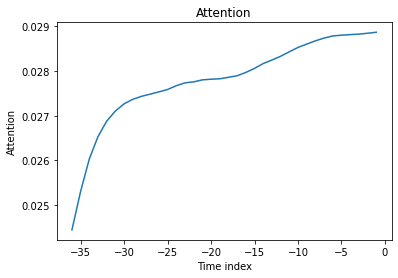

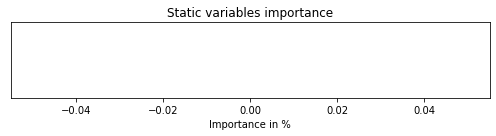

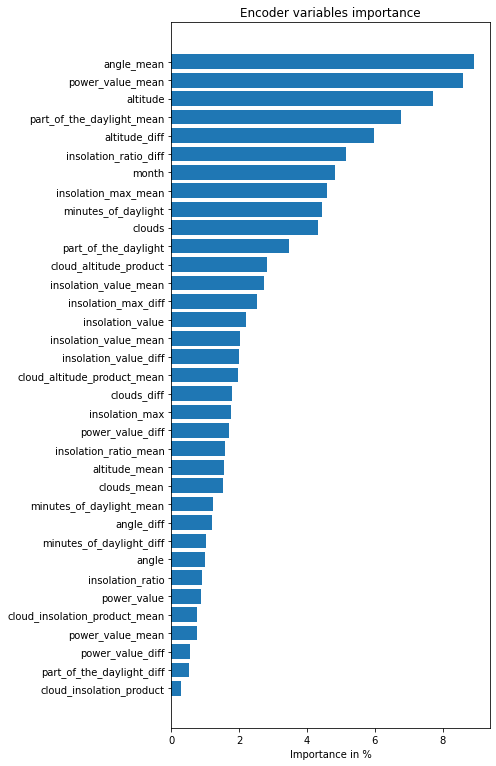

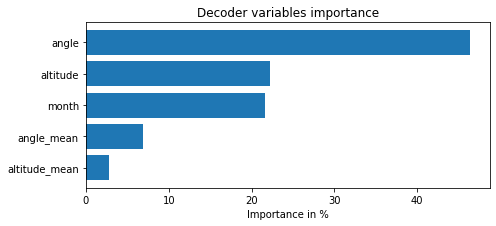

...

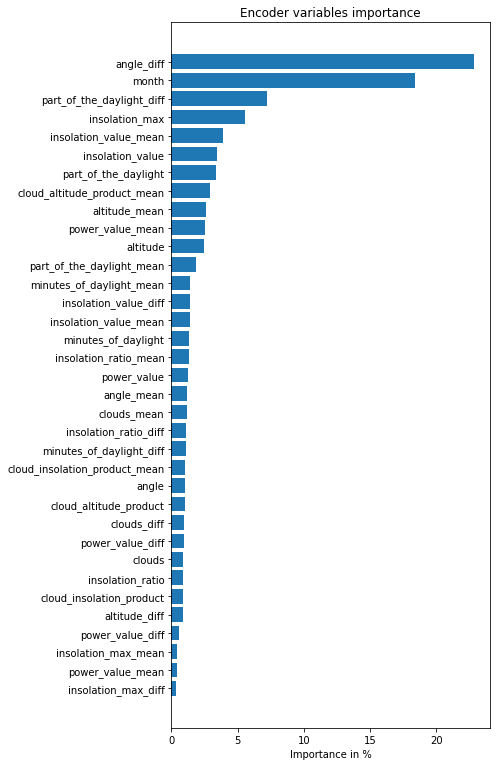

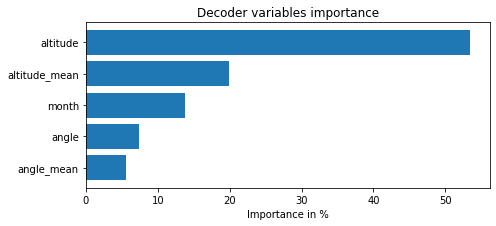

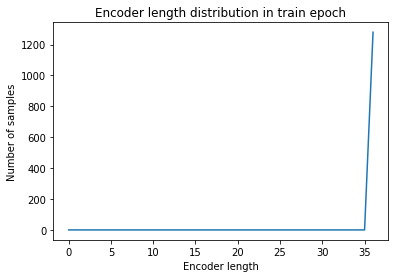

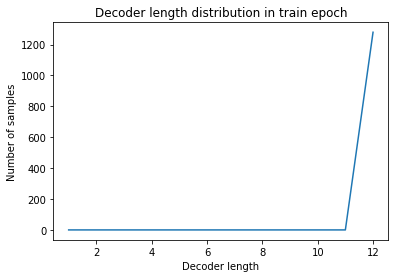

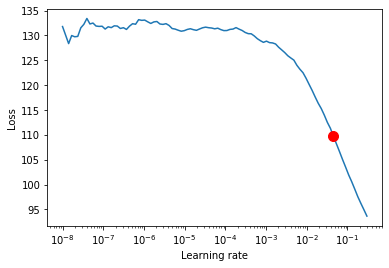

In [ ]:
# define the dataset, i.e. add metadata to pandas dataframe for the model to understand it
max_encoder_length = 36
max_prediction_length = 12
training_cutoff = data["time_idx"].max() - max_prediction_length

training = TimeSeriesDataSet(
    data[lambda x: x['time_idx'] <= training_cutoff],
    time_idx= "index",  # column name of time of observation
    target= "insolation_value",  # column name of target to predict
    group_ids=['station_id'],  # column name(s) for timeseries IDs
    max_encoder_length=max_encoder_length,  # how much history to use
    max_prediction_length=max_prediction_length,  # how far to predict into future
    # covariates static for a timeseries ID
    static_categoricals=[],
    static_reals=[],
    # covariates known and unknown in the future to inform prediction
    time_varying_known_categoricals=[],
    time_varying_known_reals=['altitude', 'angle',
                             'altitude_mean', 'angle_mean',
                             'month'],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=[
        'insolation_ratio', 'insolation_max', 'clouds', 'part_of_the_daylight', 
        'power_value', 'insolation_value', 'power_value_mean', 'insolation_value_mean', 'insolation_value_diff', 'power_value_diff',
       'cloud_altitude_product', 'cloud_insolation_product',
       'insolation_ratio_mean', 'insolation_max_mean',
       'clouds_mean', 'part_of_the_daylight_mean', 'minutes_of_daylight',
       'minutes_of_daylight_mean', 'power_value_mean',
       'cloud_altitude_product_mean', 'cloud_insolation_product_mean',
       'insolation_value_mean', 'insolation_ratio_diff', 'insolation_max_diff',
       'altitude_diff', 'clouds_diff', 'part_of_the_daylight_diff',
       'angle_diff', 'minutes_of_daylight_diff', 'power_value_diff',
       'cloud_altitude_product_diff', 'cloud_insolation_product_diff',
       'insolation_value_diff', 'month', 'time_idx'
    ],
)

# create validation dataset using the same normalization techniques as for the training dataset
validation = TimeSeriesDataSet.from_dataset(training, data, min_prediction_idx=training.index.time.max() + 1, stop_randomization=True)

# convert datasets to dataloaders for training
batch_size = 128
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=2)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size, num_workers=2)

# create PyTorch Lighning Trainer with early stopping
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=1, verbose=False, mode="min")
lr_logger = LearningRateMonitor()
trainer = pl.Trainer(
    max_epochs=100,
    gpus=0,  # run on CPU, if on multiple GPUs, use accelerator="ddp"
    gradient_clip_val=0.1,
    limit_train_batches=30,  # 30 batches per epoch
    callbacks=[lr_logger, early_stop_callback],
    logger=TensorBoardLogger("lightning_logs")
)

# define network to train - the architecture is mostly inferred from the dataset, so that only a few hyperparameters have to be set by the user
tft = TemporalFusionTransformer.from_dataset(
    # dataset
    training,
    # architecture hyperparameters
    hidden_size=32,
    attention_head_size=1,
    dropout=0.1,
    hidden_continuous_size=16,
    # loss metric to optimize
    loss=QuantileLoss(),
    # logging frequency
    log_interval=2,
    # optimizer parameters
    learning_rate=0.03,
    reduce_on_plateau_patience=4
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

# find the optimal learning rate
res = trainer.tuner.lr_find(
    tft, train_dataloader=train_dataloader, val_dataloaders=val_dataloader, early_stop_threshold=1000.0, max_lr=0.3,
)
# and plot the result - always visually confirm that the suggested learning rate makes sense
print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()

# # fit the model on the data - redefine the model with the correct learning rate if necessary
# trainer.fit(
#     tft, train_dataloader=train_dataloader, val_dataloaders=val_dataloader,
# )

In [ ]:
# fit the model on the data - redefine the model with the correct learning rate if necessary
trainer.fit(
    tft, train_dataloader=train_dataloader, val_dataloaders=val_dataloader,
)

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:531: LightningDeprecationWarning:

`trainer.fit(train_dataloader)` is deprecated in v1.4 and will be removed in v1.6. Use `trainer.fit(train_dataloaders)` instead. HINT: added 's'


   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 0     
3  | prescalers                         | ModuleDict                      | 1.1 K 
4  | static_variable_selection          | VariableSelectionNetwork        | 0     
5  | encoder_variable_selection         | VariableSelectionNetwork        | 86.4 K
6  | decoder_variable_selection         | VariableSelectionNetwork      

Validation sanity check: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/data_loading.py:327: UserWarning:

The number of training samples (30) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.



Training: 9it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

In [ ]:
# load the best model according to the validation loss
# (given that we use early stopping, this is not necessarily the last epoch)
best_model_path = trainer.checkpoint_callback.best_model_path
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

In [ ]:
# calcualte mean absolute error on validation set
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = best_tft.predict(val_dataloader)
(actuals - predictions).abs().mean()

tensor(99.9841)

In [ ]:
# raw predictions are a dictionary from which all kind of information including quantiles can be extracted
raw_predictions, x = best_tft.predict(val_dataloader, mode="raw", return_x=True)

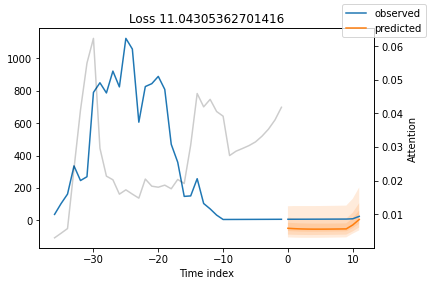

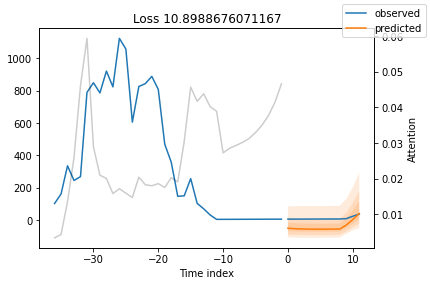

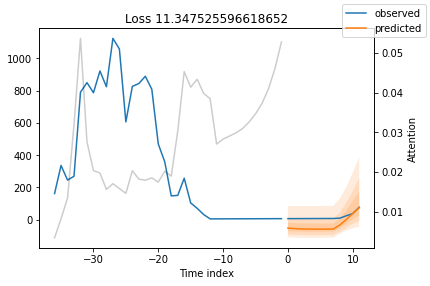

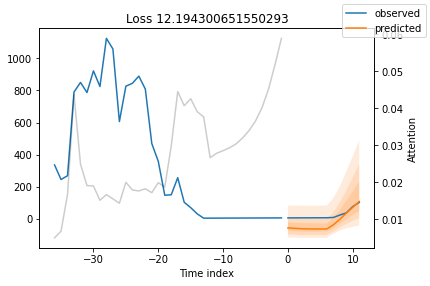

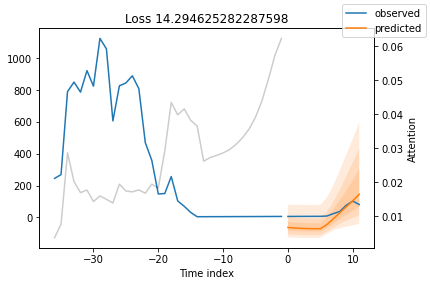

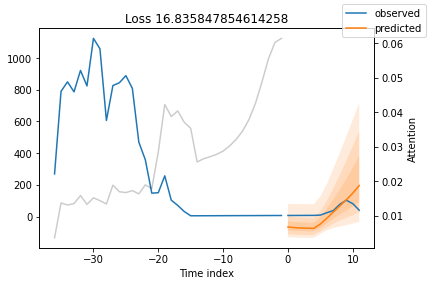

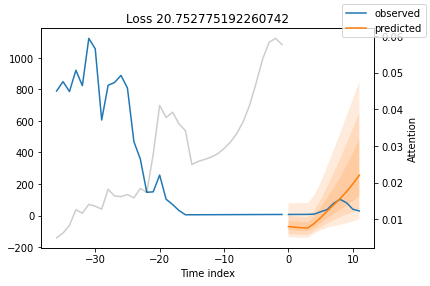

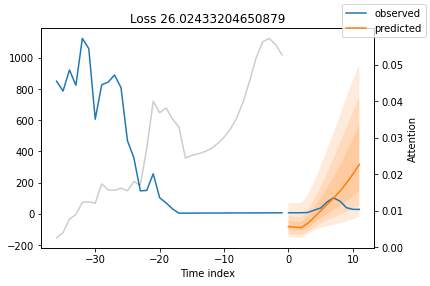

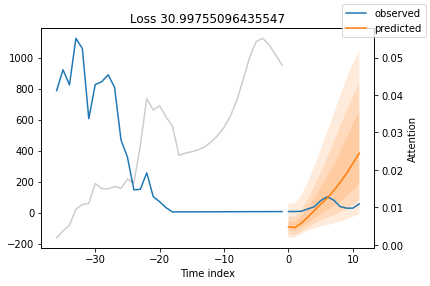

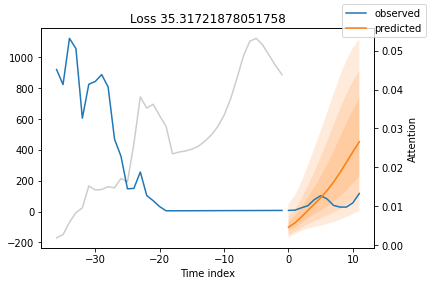

In [ ]:
for idx in range(10):  # plot 10 examples
    best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True);

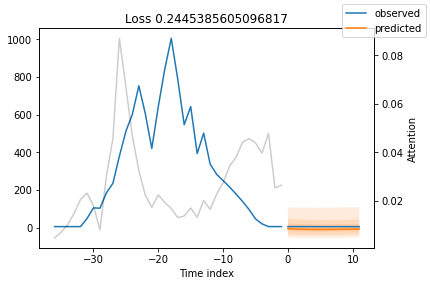

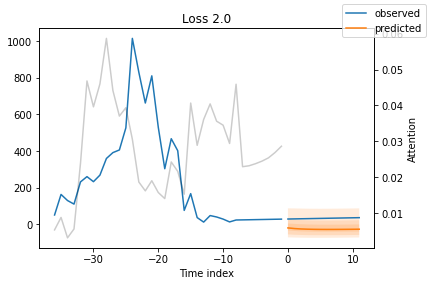

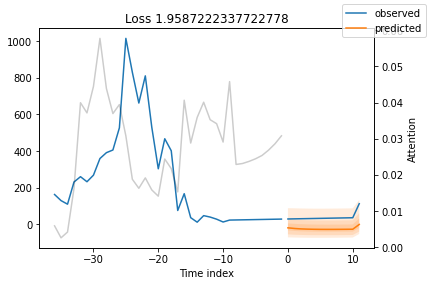

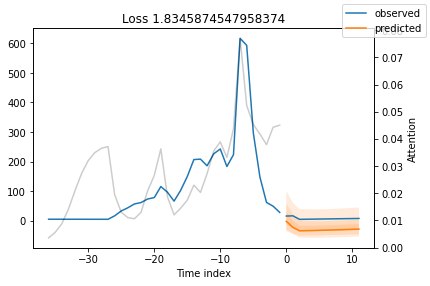

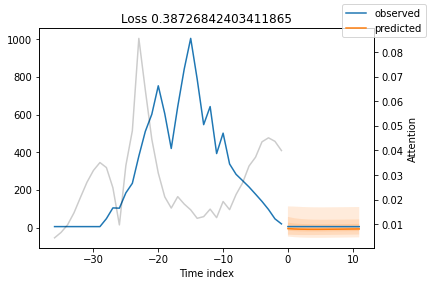

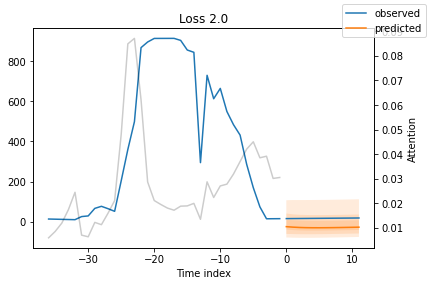

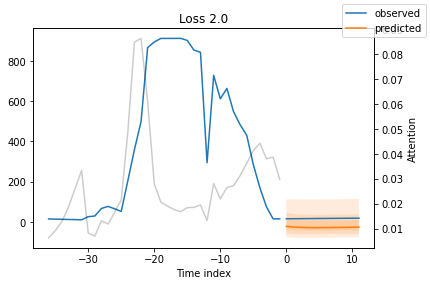

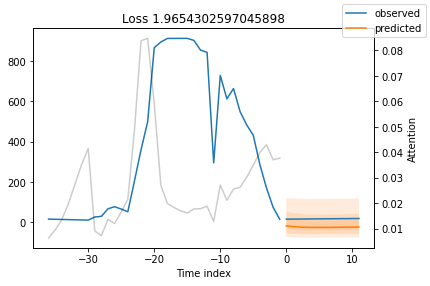

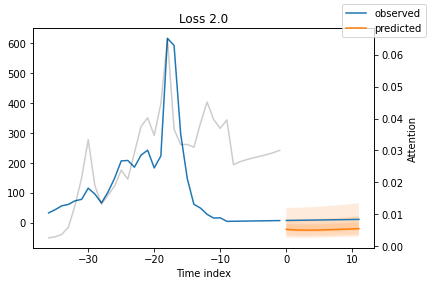

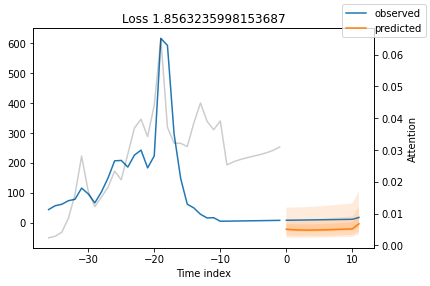

In [ ]:

# calcualte metric by which to display
predictions = best_tft.predict(val_dataloader)
mean_losses = SMAPE(reduction="none")(predictions, actuals).mean(1)
indices = mean_losses.argsort(descending=True)  # sort losses
for idx in range(10):  # plot 10 examples
    best_tft.plot_prediction(
        x, raw_predictions, idx=indices[idx], add_loss_to_title=SMAPE(quantiles=best_tft.loss.quantiles)
    );

/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/base_model.py:1506: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/base_model.py:1506: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/pytorch_forecasting/models/base_model.py:1506: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. 

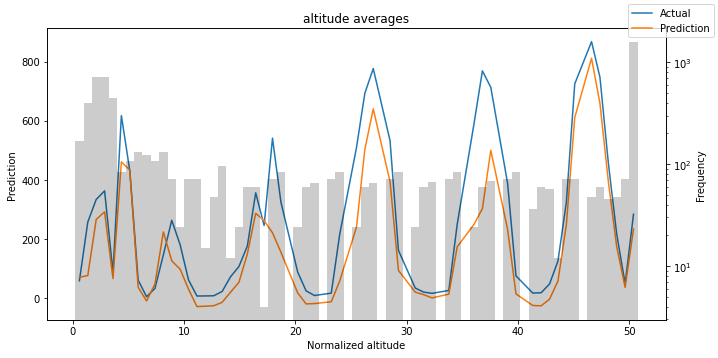

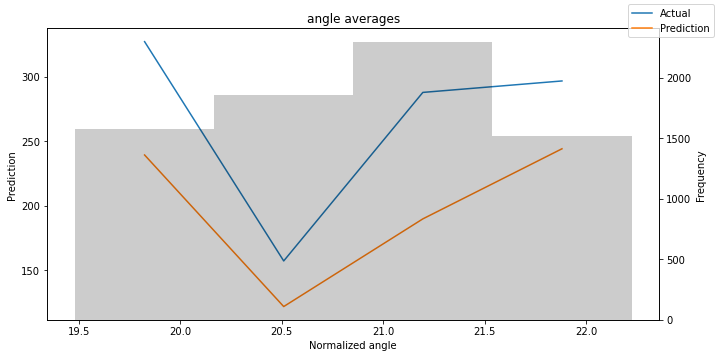

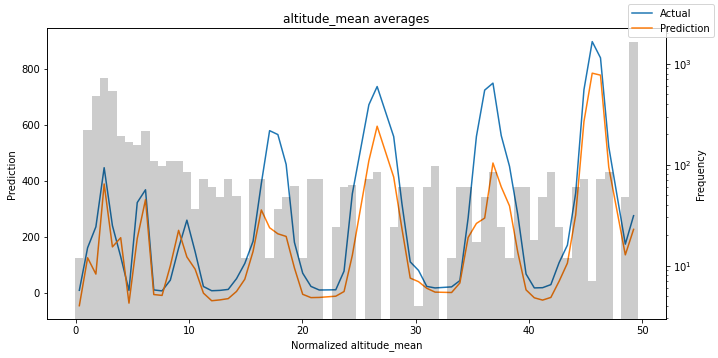

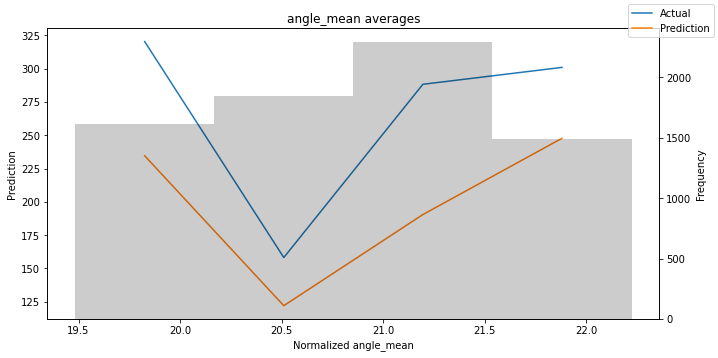

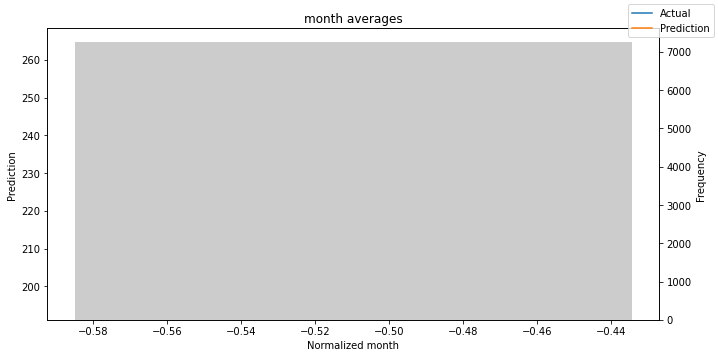

...

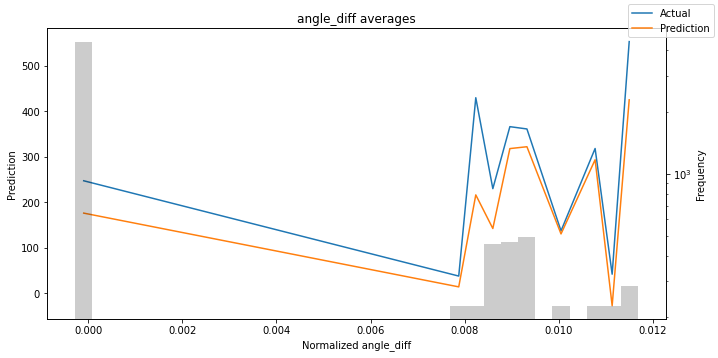

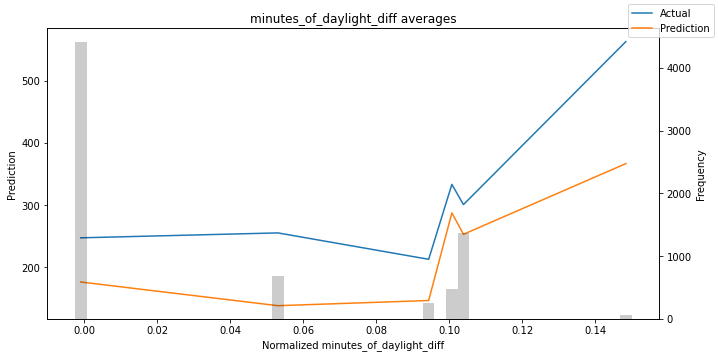

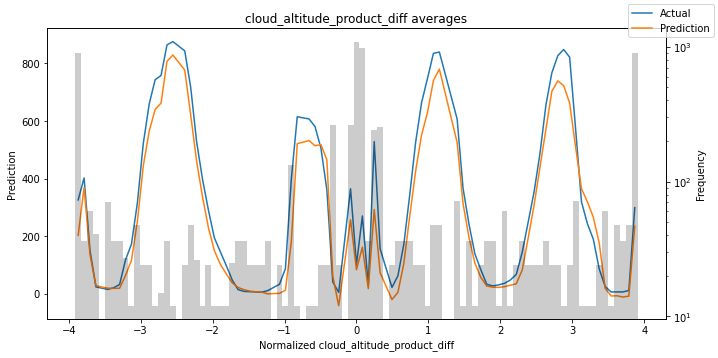

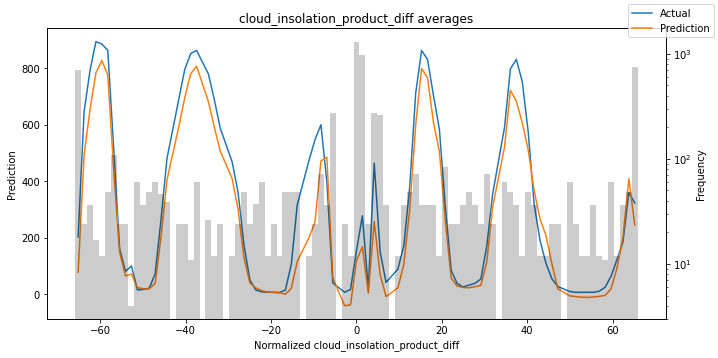

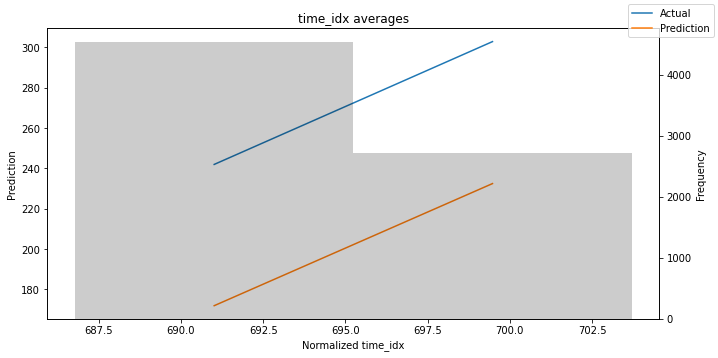

In [ ]:
predictions, x = best_tft.predict(val_dataloader, return_x=True)
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(x, predictions)
best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals);

{'attention': <Figure size 432x288 with 1 Axes>,
 'decoder_variables': <Figure size 504x234 with 1 Axes>,
 'encoder_variables': <Figure size 504x774 with 1 Axes>,
 'static_variables': <Figure size 504x144 with 1 Axes>}

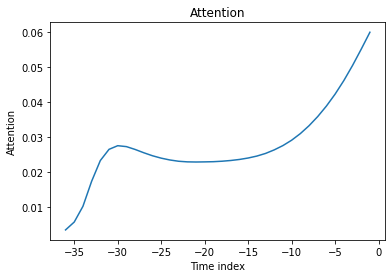

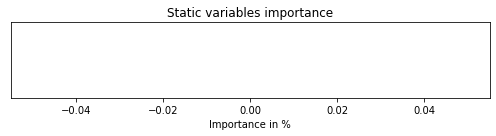

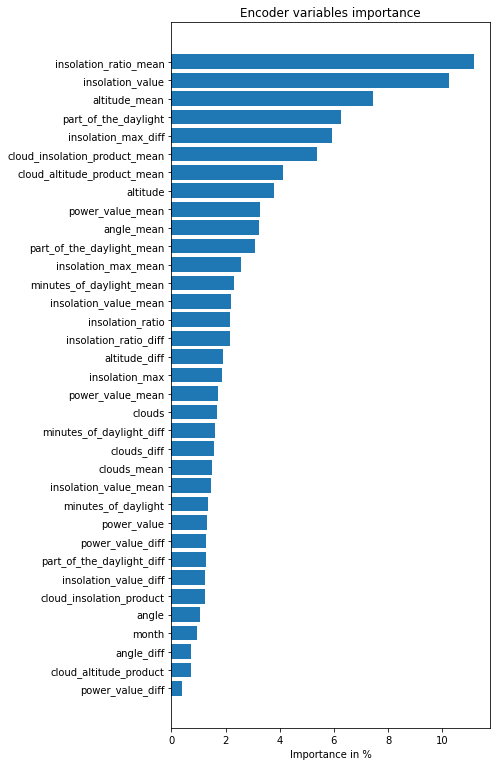

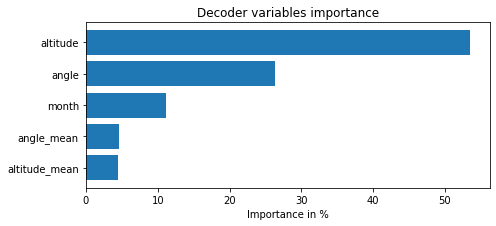

In [ ]:
interpretation = best_tft.interpret_output(raw_predictions, reduction="sum")
best_tft.plot_interpretation(interpretation)

In [ ]:
!pip install torchmetrics==0.5.0

     |████████████████████████████████| 272 kB 5.3 MB/s 
  Attempting uninstall: torchmetrics
    Found existing installation: torchmetrics 0.5.1
    Uninstalling torchmetrics-0.5.1:
      Successfully uninstalled torchmetrics-0.5.1


In [ ]:
!pip install pytorch_forecasting

     |████████████████████████████████| 112 kB 5.4 MB/s 
     |████████████████████████████████| 302 kB 40.0 MB/s 
     |████████████████████████████████| 22.3 MB 31.1 MB/s 
     |████████████████████████████████| 924 kB 50.7 MB/s 
     |████████████████████████████████| 208 kB 52.6 MB/s 
     |████████████████████████████████| 80 kB 8.2 MB/s 
     |████████████████████████████████| 829 kB 50.5 MB/s 
     |████████████████████████████████| 636 kB 41.0 MB/s 
     |████████████████████████████████| 282 kB 61.9 MB/s 
     |████████████████████████████████| 123 kB 63.2 MB/s 
     |████████████████████████████████| 1.3 MB 62.8 MB/s 
     |████████████████████████████████| 294 kB 50.6 MB/s 
     |████████████████████████████████| 142 kB 51.1 MB/s 
     |████████████████████████████████| 75 kB 4.0 MB/s 
     |████████████████████████████████| 49 kB 5.5 MB/s 
     |████████████████████████████████| 111 kB 35.5 MB/s 
     |████████████████████████████████| 144 kB 50.1 MB/s 
  Created wheel for 